In [1]:
import os
import sys
import inspect
import itertools

import numpy as np
from numpy import ma
import pandas as pd
import xarray as xr
from datetime import datetime, timedelta
from dateutil.parser import parse as parse_date
import cv2 as cv
from scipy import ndimage as ndi

import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
import cartopy.crs as ccrs


# from utils import io, abi, glm, nexrad
from tobac_flow import io, abi, glm, nexrad
from tobac_flow.plotting import goes_figure
from tobac_flow.flow import Flow
from tobac_flow import legacy_flow as lf

# Filter some warnings because pyart doesn't work nicely with notebooks

import warnings
warnings.filterwarnings(
    action='ignore',
    category=DeprecationWarning
)

import warnings
warnings.filterwarnings(
    action='ignore',
    category=UserWarning
)


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



Figure 1: Examples of growing, mature and dissipating convection in satellite, radar and lightning signature

In [2]:
# Load files
goes_data_path = '../data/GOES16'
start_date = datetime(2018,6,19,17)
days = timedelta(days=0.16)
dates = pd.date_range(start_date, start_date+days, freq='H', closed='left').to_pydatetime()

abi_files = io.find_abi_files(dates, satellite=16, product='MCMIP', view='C', mode=3, 
                              save_dir=goes_data_path, 
                              replicate_path=True, check_download=True, 
                              n_attempts=1, download_missing=True)
             

abi_dates = [io.get_goes_date(i) for i in abi_files]
print(len(abi_files))

# Get time difference (in seconds) between each file
dt = [(abi_dates[1]-abi_dates[0]).total_seconds()/60] \
     + [(abi_dates[i+2]-abi_dates[i]).total_seconds()/120 \
        for i in range(len(abi_files)-2)] \
     + [(abi_dates[-1]-abi_dates[-2]).total_seconds()/60]
dt = np.array(dt)

# Test with some multichannel data
ds_slice = {'x':slice(1325,1475), 'y':slice(725,850)}
# Load a stack of goes datasets using xarray. Select a region over Northern Florida. (full file size in 1500x2500 pixels)
goes_ds = xr.open_mfdataset(abi_files, concat_dim='t', combine='nested').isel(ds_slice)

48


In [3]:
# Extract fields and load into memory
wvd = goes_ds.CMI_C08 - goes_ds.CMI_C10
try:
    wvd = wvd.compute()
except AttributeError:
    pass

bt = goes_ds.CMI_C13
try:
    bt = bt.compute()
except AttributeError:
    pass

swd = goes_ds.CMI_C13 - goes_ds.CMI_C15
try:
    swd = swd.compute()
except AttributeError:
    pass

In [4]:
# Get GLM data
# Process new GLM data
glm_files = io.find_glm_files(dates, satellite=16,
                              save_dir=goes_data_path,
                              replicate_path=True, check_download=True,
                              n_attempts=1, download_missing=True)
glm_files = {io.get_goes_date(i):i for i in glm_files}
glm_grid = glm.regrid_glm(glm_files, goes_ds, corrected=False)

In [5]:
h = goes_ds.goes_imager_projection.perspective_point_height
glm_xy = [[np.concatenate(locs)*h for locs in zip(*[glm.get_uncorrected_glm_x_y(glm_files[ft], goes_ds)
                                                  for ft in glm_files 
                                                  if ft >= abi_dates[i] and ft < abi_dates[i]+timedelta(minutes=5)])]
         for i in [0,6,18,-1]]

In [6]:
# Get Nexrad data
if os.path.exists('../data/nexrad_regrid.nc'):
    with xr.open_dataset('../data/nexrad_regrid.nc') as ref_ds:
        ref_grid = ref_ds.ref_grid
        ref_mask = ref_ds.ref_grid
else:
    nexrad_data_path = '../data/nexrad_l2'
    print('Finding NEXRAD data')
    nexrad_sites = nexrad.filter_nexrad_sites(goes_ds,extend=0.001)
    print("Number of sites in bound: %d" % len(nexrad_sites))
    nexrad_files = sum([sum([io.find_nexrad_files(date, site, save_dir=nexrad_data_path, download_missing=True)
                             for site in nexrad_sites], [])
                        for date in dates], [])
    # Regrid nexrad - note that this is a lengthly operation, expect it to take ~1 hour for the example here
    # TODO; make pre-processed regridded nexrad file available.
    ref_grid, ref_mask = nexrad.regrid_nexrad(nexrad_files, goes_ds, min_alt=500)
    ref_ds = xr.Dataset(data_vars={'ref_grid':ref_grid, 'ref_mask':ref_mask})
    ref_ds.to_netcdf('./data/nexrad_regrid.nc')

In [7]:
# Set colormaps for different fields
from cmcrameri import cm
cm_BT = cm.lajolla_r
cm_radar = cm.batlow
cm_lightning = cm.davos
cm_WVD = cm.devon
cm_SWD = cm.lapaz

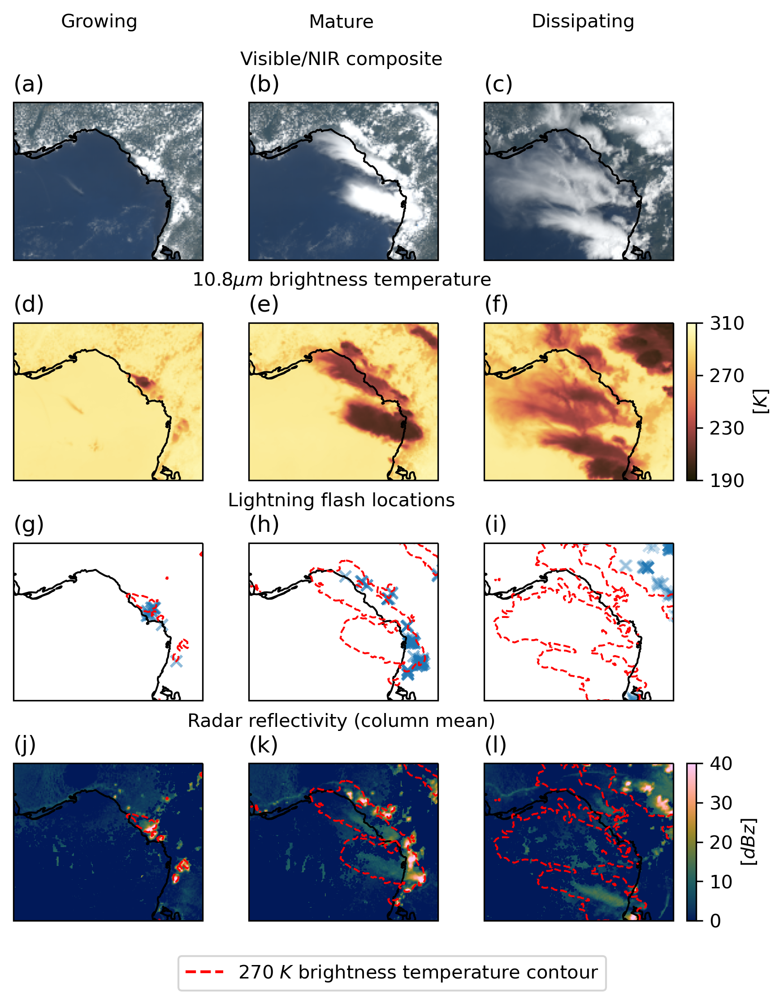

In [8]:
fig = goes_figure(goes_ds, 
                  dpi=300, figsize=(6,8))

t0 = 0
t1 = 18
t2 = -1

ax1 = fig.subplot(431)
ax1.coastlines()
ax1.imshow(abi.get_abi_rgb(goes_ds.isel({'t':t0})))
ax1.set_title('(a)', loc='left')
# ax1.set_title('Growing')

ax2 = fig.subplot(432)
ax2.coastlines()
ax2.imshow(abi.get_abi_rgb(goes_ds.isel({'t':t1})))
ax2.set_title('(b)', loc='left')
# ax2.set_title('Mature')

ax3 = fig.subplot(433)
ax3.coastlines()
ax3.imshow(abi.get_abi_rgb(goes_ds.isel({'t':t2})))
ax3.set_title('(c)', loc='left')
# ax3.set_title('Dissipating')

ax4 = fig.subplot(434)
ax4.coastlines()
ax4.imshow(goes_ds.CMI_C13[t0], vmin=190, vmax=310, cmap=cm_BT)
ax4.set_title('(d)', loc='left')

ax5 = fig.subplot(435)
ax5.coastlines()
ax5.imshow(goes_ds.CMI_C13[t1], vmin=190, vmax=310, cmap=cm_BT)
ax5.set_title('(e)', loc='left')

ax6 = fig.subplot(436)
ax6.coastlines()
img = ax6.imshow(goes_ds.CMI_C13[t2], vmin=190, vmax=310, cmap=cm_BT)
cbar = ax6.colorbar(img)
cbar.set_label('[$K$]')
cbar.set_ticks([190,230,270,310])
ax6.set_title('(f)', loc='left')

ax7 = fig.subplot(437)
ax7.coastlines()
ax7.set_title('(g)', loc='left')
ax7.contour(goes_ds.isel({'t':t0}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
ax7.scatter(glm_xy[0][0], glm_xy[0][1], c=['C0'], marker='x', alpha=0.5)
# ax7.imshow(glm_grid[t0].coarsen({"x":5, "y":5}).sum()/5, vmin=0, vmax=10, cmap=cm_lightning)

ax8 = fig.subplot(438)
ax8.coastlines()
ax8.set_title('(h)', loc='left')
ax8.contour(goes_ds.isel({'t':t1}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
ax8.scatter(glm_xy[2][0], glm_xy[2][1], c=['C0'], marker='x', alpha=0.5)
# ax8.imshow(glm_grid[t1].coarsen({"x":5, "y":5}).sum()/5, vmin=0, vmax=10, cmap=cm_lightning)

ax9 = fig.subplot(439)
ax9.coastlines()
ax9.set_title('(i)', loc='left')
ax9.contour(goes_ds.isel({'t':t2}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
ax9.scatter(glm_xy[3][0], glm_xy[3][1], c=['C0'], marker='x', alpha=0.25)
# img2 = ax9.imshow(glm_grid[t2].coarsen({"x":5, "y":5}).sum()/5, vmin=0, vmax=10, cmap=cm_lightning)
# cbar2 = ax9.colorbar(img2)
# cbar2.set_label('[flashes/minute]')

ax10 = fig.subplot(4, 3, 10)
ax10.coastlines()
ax10.set_title('(j)', loc='left')
ax10.contour(goes_ds.isel({'t':t0}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
ax10.imshow(ref_grid[t0], vmin=0, vmax=40, cmap=cm_radar)

ax11 = fig.subplot(4, 3, 11)
ax11.coastlines()
ax11.set_title('(k)', loc='left')
ax11.contour(goes_ds.isel({'t':t1}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
ax11.imshow(ref_grid[t1], vmin=0, vmax=40, cmap=cm_radar)

ax12 = fig.subplot(4, 3, 12)
ax12.coastlines()
ax12.set_title('(l)', loc='left')
ax12.contour(goes_ds.isel({'t':t2}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
img3 = ax12.imshow(ref_grid[t2], vmin=0, vmax=40, cmap=cm_radar)
cbar3 = ax12.colorbar(img3)
cbar3.set_label('[$dBz$]')
# cbar2.set_ticks([180,220,260,300])

import matplotlib.lines as mlines
fig.legend([mlines.Line2D([], [], color='r', linestyle='--')], 
           ['270 $K$ brightness temperature contour'], loc='lower center')

fig.text(0.51, 0.25, 'Radar reflectivity (column mean)', ha='center', va='baseline')
fig.text(0.51, 0.455, 'Lightning flash locations', ha='center', va='baseline')
fig.text(0.51, 0.66, '10.8$\mu m$ brightness temperature', ha='center', va='baseline')
fig.text(0.51, 0.865, 'Visible/NIR composite', ha='center', va='baseline')

fig.text(0.51, 0.9, 'Mature', ha='center', va='baseline')
fig.text(0.21, 0.9, 'Growing', ha='center', va='baseline')
fig.text(0.81, 0.9, 'Dissipating', ha='center', va='baseline')


plt.subplots_adjust(wspace=0., hspace=0.1, bottom=0.05, top=0.85, left=0.075, right=0.95)

if not os.path.isdir('./plots'):
    os.makedirs('./plots')
plt.savefig('./plots/figure01.pdf', bbox_inches='tight')
plt.savefig('./plots/figure01.png', bbox_inches='tight')

Figure 2: DCC cross section in horizontal distance and time for satellite BT and radar reflectivity

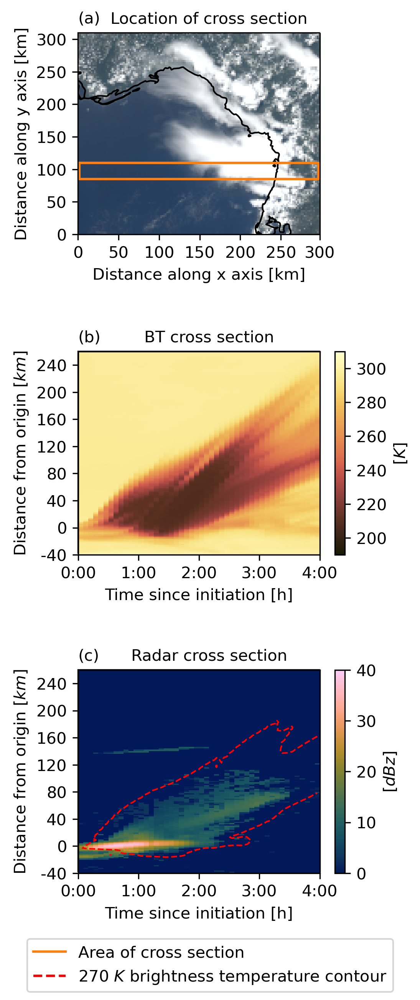

In [23]:
fig = goes_figure(goes_ds, dpi=300, figsize=(3,9))
from tobac_flow.plotting import goes_subplot
yi0=80
yi1=90


ax1 = fig.subplot(311)
# plt.subplot(131)
ax1.imshow(abi.get_abi_rgb(goes_ds.isel({'t':24})))
# from matplotlib.patches import Rectangle
# Rectangle([0,75/125],1,10/125)
x0 = bt.x.data[1]*goes_ds.goes_imager_projection.perspective_point_height
x1 = bt.x.data[-2]*goes_ds.goes_imager_projection.perspective_point_height
y0 = bt.y.data[yi0]*goes_ds.goes_imager_projection.perspective_point_height
y1 = bt.y.data[yi1]*goes_ds.goes_imager_projection.perspective_point_height

ax1.plot([x0,x1,x1,x0,x0], [y0,y0,y1,y1,y0], 'C1')
ax1.coastlines()
plt.title('(a)', loc='left', fontsize=10)
plt.title("    Location of cross section", fontsize=10)
ax1.set_xticks((bt.x*goes_ds.goes_imager_projection.perspective_point_height)[list(range(0,150,25))+[-1]])
ax1.set_xticklabels(np.arange(0,151,25)*2)
ax1.set_xlabel("Distance along x axis [km]", fontsize=10)
ax1.set_yticks((bt.y*goes_ds.goes_imager_projection.perspective_point_height)[list(range(4,125,20))])
ax1.set_yticklabels((np.arange(0,126,20)[::-1]*2.5).astype(int))
ax1.set_ylabel("Distance along y axis [km]", fontsize=10)


ax2 = fig.subplot(312)
ax3 = fig.subplot(313)

import matplotlib.lines as mlines
fig.legend([mlines.Line2D([], [], color='C1', linestyle='-'), mlines.Line2D([], [], color='r', linestyle='--')], 
           ['Area of cross section', '270 $K$ brightness temperature contour'], loc='lower center')

plt.subplots_adjust(hspace=0.3, bottom=0.1, top=0.95, left=0.075, right=0.95)


box = ax2.get_position()
plt.axes([box.x0+box.width*0.1, box.y0+box.height*0.08, box.width*1.0, box.height*0.83])
plt.imshow(bt[:,yi0:yi1].mean('y').T, cmap=cm_BT, vmin=190, vmax=310, aspect='auto', origin='upper')
cbar = plt.colorbar()
cbar.set_label('[$K$]')

# plt.contour(wvd_growth[:,75:85].mean(1).T, [0.25], colors=['C00'], linewidths=[2])
plt.xticks([-0.5,11.5,23.5,35.5,47.5], labels=['0:00', '1:00', '2:00', '3:00', '4:00'])
# plt.yticks([])
plt.yticks(np.arange(149.5,0,-20), labels=range(-40,250,40))
plt.title('(b)', loc='left', fontsize=10)
plt.ylabel('Distance from origin [$km$]')
plt.xlabel('Time since initiation [h]')
plt.title('    BT cross section', fontsize=10)

box = ax3.get_position()
plt.axes([box.x0+box.width*0.1, box.y0+box.height*0.08, box.width*1.0, box.height*0.83])
plt.imshow(ref_grid[:,yi0:yi1].mean('y').T, cmap=cm_radar, vmin=0, vmax=40, aspect='auto', origin='upper')
cbar = plt.colorbar()
cbar.set_label('[$dBz$]')
plt.contour(bt[:,yi0:yi1].mean('y').T, [270], colors=['r'], linestyles=['--'], linewidths=[1])
plt.xticks([-0.5,11.5,23.5,35.5,47.5], labels=['0:00', '1:00', '2:00', '3:00', '4:00'])
# plt.yticks([])
plt.title('(c)', loc='left', fontsize=10)
plt.yticks(np.arange(149.5,0,-20), labels=range(-40,250,40))
plt.ylabel('Distance from origin [$km$]')
plt.xlabel('Time since initiation [h]')
plt.title('    Radar cross section', fontsize=10)


plt.savefig('./plots/figure02.pdf', bbox_inches='tight')
plt.savefig('./plots/figure02.png', bbox_inches='tight')

Figure 3: GOES ABI imagery for channel 13, WVD, and SWD combinations

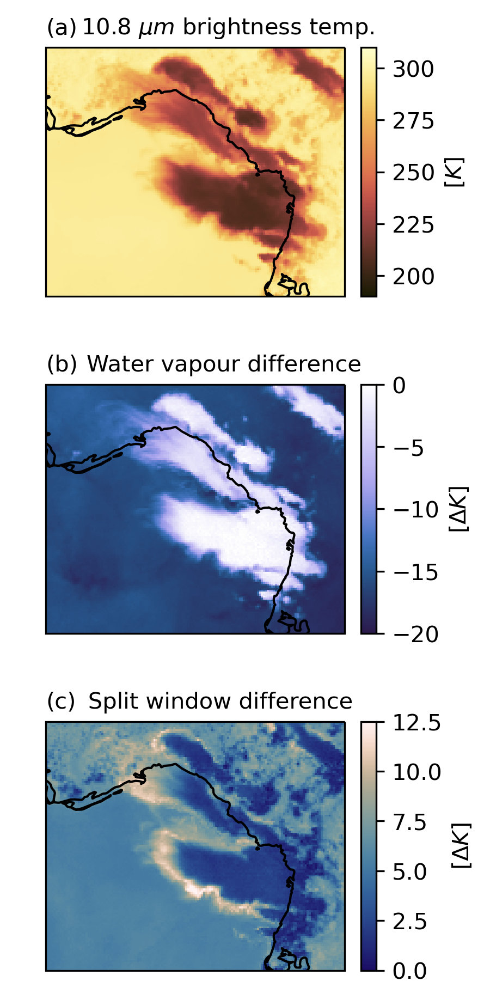

In [10]:
fig = goes_figure(goes_ds, dpi=300, figsize=(4,8))

ax1 = fig.subplot(311)
ax1.coastlines()
im1 = ax1.imshow(bt[24], cmap=cm_BT, vmin=190, vmax=310)
cbar1 = ax1.colorbar(im1)
cbar1.set_label('[$K$]', fontsize=10)
# cbar1.set_ticks([190,230,270,310])
ax1.set_title('(a)', loc='left', fontsize=10)
ax1.set_title('         10.8 $\mu m$ brightness temp.', fontsize=10)

ax2 = fig.subplot(312)
ax2.coastlines()
im2 = ax2.imshow(wvd[24], cmap=cm_WVD, vmin=-20, vmax=0)
cbar2 = ax2.colorbar(im2)
cbar2.set_label('[$\Delta K$]', fontsize=10)
ax2.set_title('(b)', loc='left', fontsize=10)
ax2.set_title('        Water vapour difference', fontsize=10)

ax3 = fig.subplot(313)
ax3.coastlines()
im3 = ax3.imshow(swd[24], cmap=cm_SWD, vmin=0, vmax=12.5)
cbar3 = ax3.colorbar(im3)
cbar3.set_label('[$\Delta K$]', fontsize=10)
ax3.set_title('(c)', loc='left', fontsize=10)
ax3.set_title('       Split window difference', fontsize=10)

plt.subplots_adjust(hspace=0.1, bottom=0.1, top=0.85, left=0.075, right=0.95)

plt.savefig('./plots/figure03.pdf', bbox_inches='tight')
plt.savefig('./plots/figure03.png', bbox_inches='tight')

Figure 4: Optical flow vector examples

In [11]:
flow_kwargs = {'pyr_scale':0.5, 'levels':6, 'winsize':16, 'iterations':3, 
               'poly_n':5, 'poly_sigma':1.1, 'flags':cv.OPTFLOW_FARNEBACK_GAUSSIAN}

flow = Flow(bt, flow_kwargs=flow_kwargs, smoothing_passes=3)

In [12]:
# Estimate residual uncertainty in the flow field
previous_step_structure = np.zeros([3,3,3], dtype=bool)
previous_step_structure[0,1,1] = True

# Transalte each image from the previous step according to the detected flow vectors
previous_step_warp = flow.convolve(bt, previous_step_structure)[0]

residual_flow = np.full(flow.shape+(2,), np.nan, dtype=np.float32)

for i in range(flow.shape[0]-1):
    print(i, end='\r')
    a, b = bt[i].compute().data, previous_step_warp[i]
    
    residual_flow[i] = flow.cv_flow(a, b, **flow_kwargs)

residual_flow = ma.array(residual_flow, 
                         mask=np.logical_or(
                             np.tile(np.logical_or(np.isnan(previous_step_warp), bt.data>270)[...,np.newaxis], 
                                     (1,1,1,2)), 
                             np.isnan(residual_flow)))

residual_flow_magnitudes = (residual_flow[...,0]**2 + residual_flow[...,1]**2)**0.5
flow_magnitudes = (flow.flow_for[...,0]**2 + flow.flow_for[...,1]**2)**0.5
relative_residual_flow_magnitudes = residual_flow_magnitudes/flow_magnitudes

/Users/jonesw/opt/anaconda3/envs/tobac_flow/lib/python3.8/site-packages/tobac_flow/flow.py:38: RuntimeWarning: All-NaN slice encountered
  vmin = np.nanmin(array)
/Users/jonesw/opt/anaconda3/envs/tobac_flow/lib/python3.8/site-packages/tobac_flow/flow.py:40: RuntimeWarning: All-NaN slice encountered
  vmax = np.nanmax(array)


In [13]:
# Residual uncertainty in optical flow vectors
print("mean:", np.nanmean(relative_residual_flow_magnitudes))
print("median:", np.median(relative_residual_flow_magnitudes[~relative_residual_flow_magnitudes.mask]))

mean: 0.14954793
median: 0.08430337905883789


In [34]:
((flow.flow_for[i:i+j-1,...,0].mean(0))**2+(flow.flow_for[i:i+j-1,...,1].mean(0))**2).shape

(125, 150)

(array([7491., 1565., 1088., 1243., 1429., 1370., 1252., 1656., 1052.,
         604.]),
 array([5.9812812e-08, 3.8516650e-01, 7.7033293e-01, 1.1554995e+00,
        1.5406659e+00, 1.9258323e+00, 2.3109987e+00, 2.6961651e+00,
        3.0813317e+00, 3.4664981e+00, 3.8516645e+00], dtype=float32),
 <BarContainer object of 10 artists>)

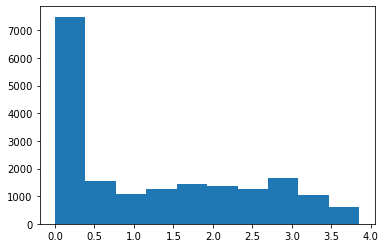

In [41]:
plt.hist((((flow.flow_for[i:i+j-1,...,0].mean(0))**2+(flow.flow_for[i:i+j-1,...,1].mean(0))**2)**0.5).ravel())

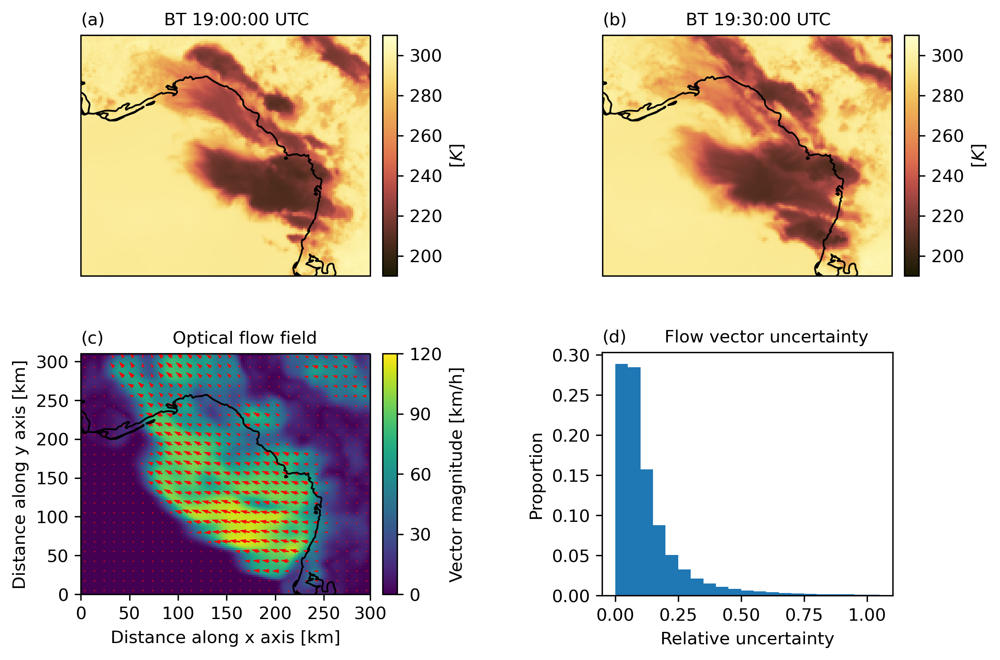

In [22]:
fig = goes_figure(goes_ds, dpi=300, figsize=(8,7))
from matplotlib.gridspec import GridSpec
gs = GridSpec(2, 2, width_ratios=[1,1])
j=6
i=24

ax1 = fig.subplot(gs[0,0])
ax1.coastlines()
im1 = ax1.imshow(bt[i], cmap=cm_BT, vmin=190, vmax=310)
cbar1 = ax1.colorbar(im1)
cbar1.set_label('[$K$]', fontsize=10)
# cbar1.set_ticks([190,230,270,310])
ax1.set_title('(a)', loc='left', fontsize=10)
ax1.set_title('    BT 19:00:00 UTC', fontsize=10)

ax2 = fig.subplot(gs[0,1])
ax2.coastlines()
im2 = ax2.imshow(bt[i+j], cmap=cm_BT, vmin=190, vmax=310)
cbar2 = ax2.colorbar(im2)
cbar2.set_label('[$K$]', fontsize=10)
# cbar1.set_ticks([190,230,270,310])
ax2.set_title('(b)', loc='left', fontsize=10)
ax2.set_title('    BT 19:30:00 UTC', fontsize=10)

ax3 = fig.subplot(gs[1,0])
# ax1.imshow(abi.get_abi_rgb(goes_ds.isel({'t':18})))
ax3.coastlines()
im3 = ax3.imshow(((flow.flow_for[i:i+j-1,...,0].mean(0)*2.5)**2+(flow.flow_for[i:i+j-1,...,1].mean(0)*2)**2)**0.5*12, vmin=0, vmax=120)
cbar3 = ax3.colorbar(im3)
cbar3.set_label('Vector magnitude [km/h]', fontsize=10)
cbar3.set_ticks([0,30,60,90,120])
# ax3.contour(goes_ds.isel({'t':i}).CMI_C13, [270], colors=['C00'])
# ax3.contour(goes_ds.isel({'t':i+j}).CMI_C13, [270], colors=['C01'], linestyles=['--'])
q = ax3.quiver(flow.flow_for[i:i+j-1,...,0].mean(0),-flow.flow_for[i:i+j-1,...,1].mean(0), spacing=5, scale=100, width=0.005, color='r')
ax3.set_title('(c)', loc='left', fontsize=10)
ax3.set_title('       Optical flow field', fontsize=10)
ax3.set_xticks((bt.x*goes_ds.goes_imager_projection.perspective_point_height)[list(range(0,150,25))+[-1]])
ax3.set_xticklabels(np.arange(0,151,25)*2)
ax3.set_xlabel("Distance along x axis [km]", fontsize=10)
ax3.set_yticks((bt.y*goes_ds.goes_imager_projection.perspective_point_height)[list(range(4,125,20))])
ax3.set_yticklabels((np.arange(0,126,20)[::-1]*2.5).astype(int))
ax3.set_ylabel("Distance along y axis [km]", fontsize=10)
# plt.quiverkey(q, 0.1, -0.4, 5, '  Optical flow vector', angle=180, coordinates='axes', labelpos='E')

ax = fig.subplot(gs[1,1])

plt.subplots_adjust(hspace=0.1, wspace=0.4, bottom=0.25, top=0.95, left=0.05, right=0.95)

box = ax.get_position()
ax4 = plt.axes([box.x0+box.width*0.11, box.y0+box.height*0.08, box.width*0.78, box.height*0.84])
h = ax4.hist(relative_residual_flow_magnitudes[~relative_residual_flow_magnitudes.mask], 
         weights=np.full_like(relative_residual_flow_magnitudes[~relative_residual_flow_magnitudes.mask], 1/relative_residual_flow_magnitudes[~relative_residual_flow_magnitudes.mask].size), 
                              bins=np.arange(0,1.1,0.05))
ax4.set_title('(d)', loc='left', fontsize=10)
ax4.set_title('       Flow vector uncertainty', fontsize=10)
ax4.set_xlabel("Relative uncertainty", fontsize=10)
ax4.set_ylabel("Proportion", fontsize=10)

plt.savefig('./plots/figure04.pdf', bbox_inches='tight')
plt.savefig('./plots/figure04.png', bbox_inches='tight')

Figure 5: Lagrangian convolution kernel

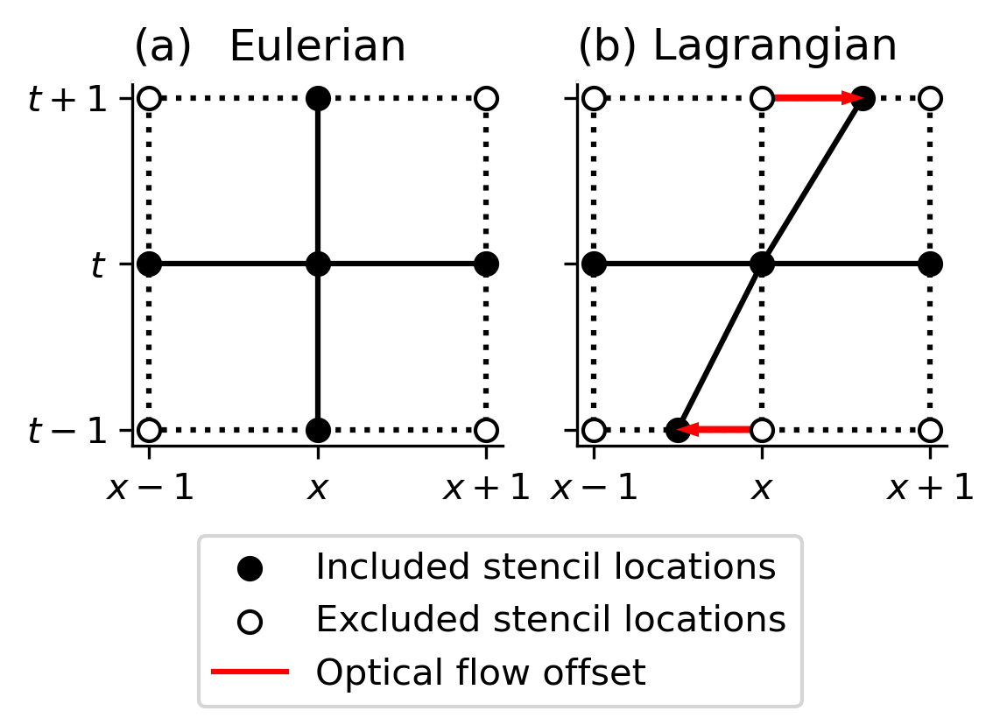

In [15]:
fig = plt.figure(dpi=300, figsize=(4,2.75))

ax1 = plt.subplot(121)
ax1.spines['top'].set_color('white')
ax1.spines['right'].set_color('white')
plt.plot([1,-1],[0,0],'k-')
plt.plot([0,0],[1,-1],'k-')
plt.plot([1,-1],[1,1],'k:')
plt.plot([1,-1],[-1,-1],'k:')
plt.plot([1,1],[1,-1],'k:')
plt.plot([-1,-1],[1,-1],'k:')

include_points = plt.scatter([0,0,0,1,-1],[-1,0,1,0,0], c='k', zorder=3)
exclude_points = plt.scatter([1,1,-1,-1],[1,-1,-1,1], c='white', edgecolors='k', zorder=5)

plt.xticks([-1,0,1], labels=['$x-1$', '$x$', '$x+1$'])
plt.yticks([-1,0,1], labels=['$t-1$', '$t$', '$t+1$'])

plt.title('(a)', loc='left')
plt.title('Eulerian')

plt.xlim([-1.1,1.1])
plt.ylim([-1.1,1.1])

ax2 = plt.subplot(122)
ax2.spines['top'].set_color('white')
ax2.spines['right'].set_color('white')
plt.plot([1,-1],[0,0],'k-')
plt.plot([0.6,0,-0.5],[1,0,-1],'k-')
plt.plot([0,0],[1,-1],'k:')
plt.plot([1,-1],[1,1],'k:')
plt.plot([1,-1],[-1,-1],'k:')
plt.plot([1,1],[1,-1],'k:')
plt.plot([-1,-1],[1,-1],'k:')

plt.scatter([-0.5,0,0.6,1,-1],[-1,0,1,0,0], c='k', zorder=3)
plt.scatter([1,1,-1,-1,0,0],[1,-1,-1,1,1,-1], c='white', edgecolors='k', zorder=5)

offset_arrow = plt.arrow(0,-1,-0.475,0,color='r',zorder=4, width=0.02, length_includes_head=True)
plt.arrow(0,1,0.575,0,color='r',zorder=4, width=0.02, length_includes_head=True)

plt.xticks([-1,0,1], labels=['$x-1$', '$x$', '$x+1$'])
plt.yticks([-1,0,1], labels=['', '', ''])

plt.title('(b)', loc='left')
plt.title('  Lagrangian')

plt.xlim([-1.1,1.1])
plt.ylim([-1.1,1.1])

fig.legend([include_points, exclude_points, mlines.Line2D([], [], color='r', linestyle='-')], 
           ['Included stencil locations', 'Excluded stencil locations', 'Optical flow offset'], 
           loc='lower center')

plt.subplots_adjust(bottom=0.375, wspace=0.2)

plt.savefig('./plots/figure05.pdf', bbox_inches='tight')
plt.savefig('./plots/figure05.png', bbox_inches='tight')

Figure 6: Detection of growing deep convection

In [16]:
# Get growth_rate of the wvd field and find markers
from tobac_flow.detection import detect_growth_markers
wvd_growth, growth_markers = detect_growth_markers(flow, wvd)

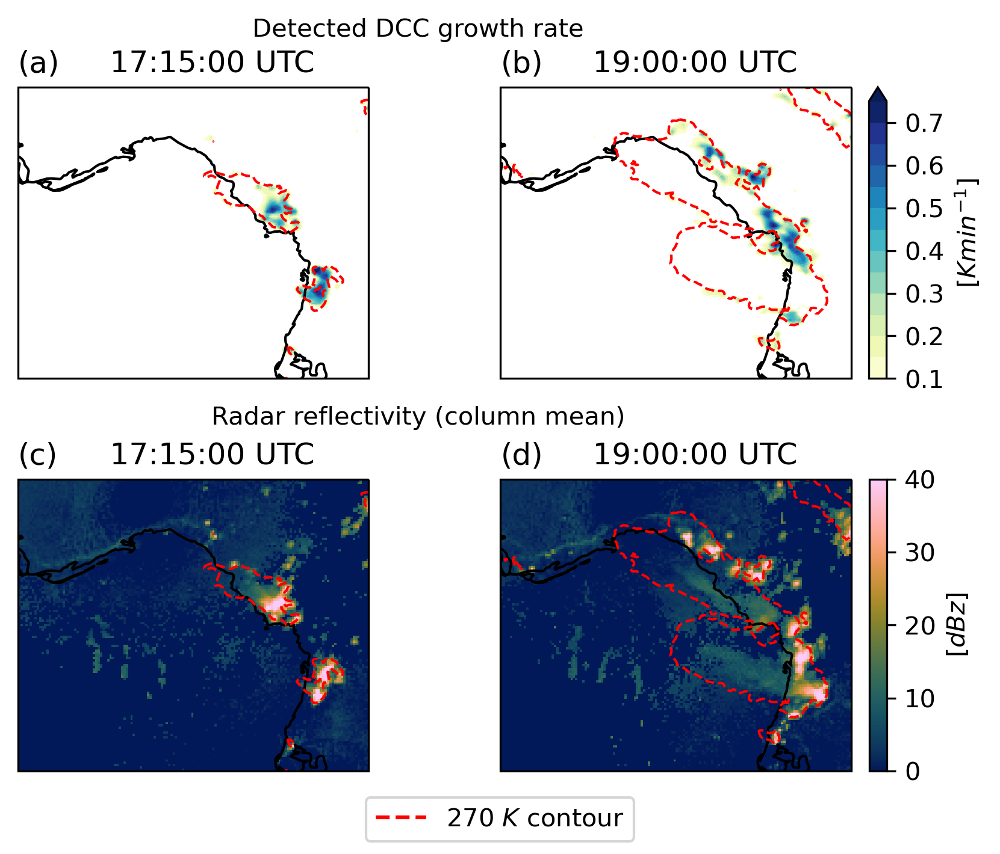

In [17]:
fig = goes_figure(goes_ds, dpi=300, figsize=(6,5))
i1=3
ax1 = fig.subplot(221)
ax1.coastlines()
ax1.contour(goes_ds.isel({'t':i1}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=[1])
c1 = ax1.contourf(wvd_growth[i1], np.arange(0.1,0.8,0.05), extend='max', cmap='YlGnBu')
ax1.set_title('(a)', loc='left')
ax1.set_title('    17:15:00 UTC')

ax2 = fig.subplot(222)
i2=18
ax2.coastlines()
ax2.contour(goes_ds.isel({'t':i2}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=[1])
c2 = ax2.contourf(wvd_growth[i2], np.arange(0.1,0.8,0.05), extend='max', cmap='YlGnBu')
ax2.set_title('(b)', loc='left')
ax2.set_title('    19:00:00 UTC')

cbar = ax2.colorbar(c2)
cbar.set_label('[$K min^{-1}$]')

ax3 = fig.subplot(223)
ax3.coastlines()
ax3.set_title('(c)', loc='left')
ax3.set_title('    17:15:00 UTC')
ax3.contour(goes_ds.isel({'t':i1}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
ax3.imshow(ref_grid[i1], vmin=0, vmax=40, cmap=cm_radar)

ax4 = fig.subplot(224)
ax4.coastlines()
ax4.set_title('(d)', loc='left')
ax4.set_title('    19:00:00 UTC')
ax4.contour(goes_ds.isel({'t':i2}).CMI_C13, [270], colors=['r'], linestyles=['--'], linewidths=1)
img4 = ax4.imshow(ref_grid[i2], vmin=0, vmax=40, cmap=cm_radar)

cbar2 = ax4.colorbar(img4)
cbar2.set_label('[$dBz$]')

fig.legend([mlines.Line2D([], [], color='r', linestyle='--')], 
           ['270 $K$ contour'], loc='lower center')

fig.text(0.51, 0.9, 'Detected DCC growth rate', ha='center', va='baseline')
fig.text(0.51, 0.47, 'Radar reflectivity (column mean)', ha='center', va='baseline')

plt.subplots_adjust(bottom=0.05, hspace=0.1, wspace=0.1, left=0.1, right=0.95)

plt.savefig('./plots/figure06.pdf', bbox_inches='tight')
plt.savefig('./plots/figure06.png', bbox_inches='tight')

In [18]:
print('Growth above threshold: area =', np.sum(wvd_growth>=0.5))
print('Detected markers: area =', np.sum(growth_markers.data!=0))
print('Detected markers: n =', growth_markers.data.max())


Growth above threshold: area = 2870
Detected markers: area = 2672
Detected markers: n = 12


In [19]:
upper_threshold=-5
lower_threshold=-15
inner_field = wvd-swd

inner_field = np.maximum(np.minimum(inner_field, upper_threshold), lower_threshold)
inner_field.data[growth_markers!=0] = upper_threshold
inner_edges = flow.sobel(inner_field, direction='uphill')

In [20]:
outer_field = wvd+swd
outer_field = np.maximum(np.minimum(outer_field, 0), -10)
outer_field.data[growth_markers!=0] = 0
outer_edges = flow.sobel(outer_field, direction='uphill')

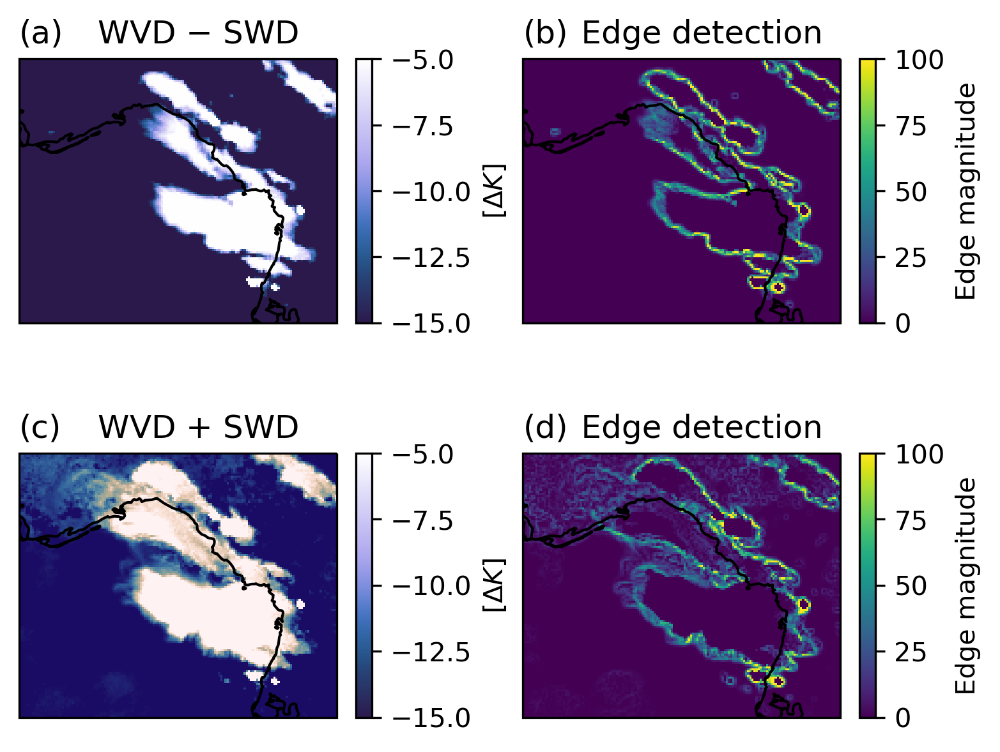

In [21]:
fig = goes_figure(goes_ds, dpi=300, figsize=(6,5))

ax1 = fig.subplot(221)
ax1.coastlines()
img1 = ax1.imshow(inner_field[24], vmin=-15, vmax=-5, cmap=cm_WVD)
cbar = ax1.colorbar(img1)
cbar.set_label('[$\Delta K$]')
cbar.ax.set_yticks([-5,-7.5,-10.,-12.5,-15])
ax1.set_title('(a)', loc='left')
ax1.set_title('    WVD $-$ SWD')


ax2 = fig.subplot(222)
ax2.coastlines()
img2 = ax2.imshow(inner_edges[24], vmin=0, vmax=100)
cbar = ax2.colorbar(img2)
cbar.set_label('Edge magnitude')
ax2.set_title('(b)', loc='left')
ax2.set_title('    Edge detection')

ax3 = fig.subplot(223)
ax3.coastlines()
img3 = ax3.imshow(outer_field[24], vmin=-10, vmax=0, cmap=cm_SWD)
cbar = ax3.colorbar(img1)
cbar.set_label('[$\Delta K$]')
cbar.ax.set_yticks([0,-2.5,-5,-7.5,-10.])
ax3.set_title('(c)', loc='left')
ax3.set_title('    WVD $+$ SWD')


ax4 = fig.subplot(224)
ax4.coastlines()
img4 = ax4.imshow(outer_edges[24], vmin=0, vmax=100)
cbar = ax4.colorbar(img4)
cbar.set_label('Edge magnitude')
ax4.set_title('(d)', loc='left')
ax4.set_title('    Edge detection')

plt.subplots_adjust(wspace=0.3)

plt.savefig('./plots/figure07.pdf', bbox_inches='tight')
plt.savefig('./plots/figure07.png', bbox_inches='tight')

Figure 8: Detected anvil area

In [24]:
# Watershed anvil regions connected to growth markers
from tobac_flow.detection import edge_watershed
inner_watershed = edge_watershed(flow, wvd-swd, growth_markers!=0, -5, -15)


In [25]:
from tobac_flow.analysis import filter_labels_by_length_and_mask
inner_labels = filter_labels_by_length_and_mask(flow.label(inner_watershed), growth_markers.data!=0, 3)
print('Detected anvils: area =', np.sum(inner_labels!=0))
print('Detected anvils: n =', inner_labels.max())


Detected anvils: area = 123872
Detected anvils: n = 2


In [26]:
outer_watershed = edge_watershed(flow, wvd+swd, inner_labels, 0, -10)
print('Detected thin anvils: area =', np.sum(outer_watershed!=0))


Detected thin anvils: area = 218023


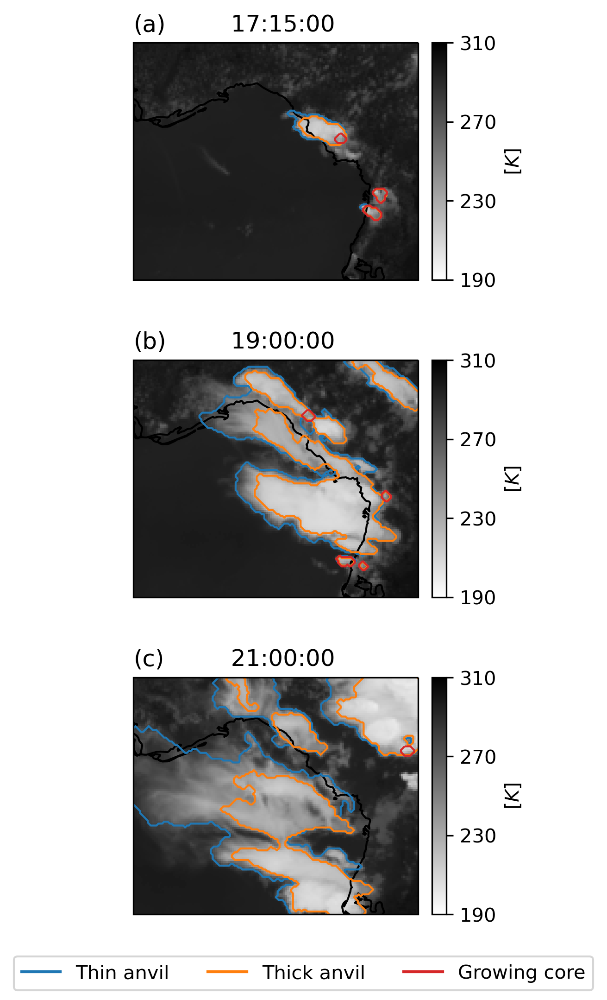

In [27]:
fig = goes_figure(goes_ds, dpi=300, figsize=(4,8))

i1=3
ax1 = fig.subplot(311)
ax1.coastlines()
img = ax1.imshow(goes_ds.CMI_C13[i1], vmin=190, vmax=310, cmap='binary')
cbar = ax1.colorbar(img)
cbar.set_label('[$K$]')
cbar.set_ticks([190,230,270,310])
ax1.set_title('(a)', loc='left')
ax1.set_title('  17:15:00')

ax1.contour(outer_watershed[i1], [0.5], colors=['C00'], linewidths=[1])
ax1.contour(inner_watershed[i1], [0.5], colors=['C01'], linewidths=[1])
ax1.contour(growth_markers[i1], [0.5], colors=['C03'], linewidths=[1])

i2=24
ax2 = fig.subplot(312)
ax2.coastlines()
img = ax2.imshow(goes_ds.CMI_C13[i2], vmin=190, vmax=310, cmap='binary')
cbar = ax2.colorbar(img)
cbar.set_label('[$K$]')
cbar.set_ticks([190,230,270,310])
ax2.set_title('(b)', loc='left')
ax2.set_title('  19:00:00')

ax2.contour(outer_watershed[i2], [0.5], colors=['C00'], linewidths=[1])
ax2.contour(inner_watershed[i2], [0.5], colors=['C01'], linewidths=[1])
ax2.contour(growth_markers[i2], [0.5], colors=['C03'], linewidths=[1])

i3=47
ax3 = fig.subplot(313)
ax3.coastlines()
img = ax3.imshow(goes_ds.CMI_C13[-1], vmin=190, vmax=310, cmap='binary')
cbar = ax3.colorbar(img)
cbar.set_label('[$K$]')
cbar.set_ticks([190,230,270,310])
ax3.set_title('(c)', loc='left')
ax3.set_title('  21:00:00')

ax3.contour(outer_watershed[i3], [0.5], colors=['C00'], linewidths=[1])
ax3.contour(inner_watershed[i3], [0.5], colors=['C01'], linewidths=[1])
ax3.contour(growth_markers[i3], [0.5], colors=['C03'], linewidths=[1])

import matplotlib.lines as mlines
fig.legend([mlines.Line2D([], [], color='C00'), mlines.Line2D([], [], color='C01'), mlines.Line2D([], [], color='C03')], 
           ['Thin anvil', 'Thick anvil', 'Growing core'], loc='lower center', ncol=3)

plt.subplots_adjust(bottom=0.05, hspace=0.1, left=0)

plt.savefig('./plots/figure08.pdf', bbox_inches='tight')
plt.savefig('./plots/figure08.png', bbox_inches='tight')

An animation of the detected regions

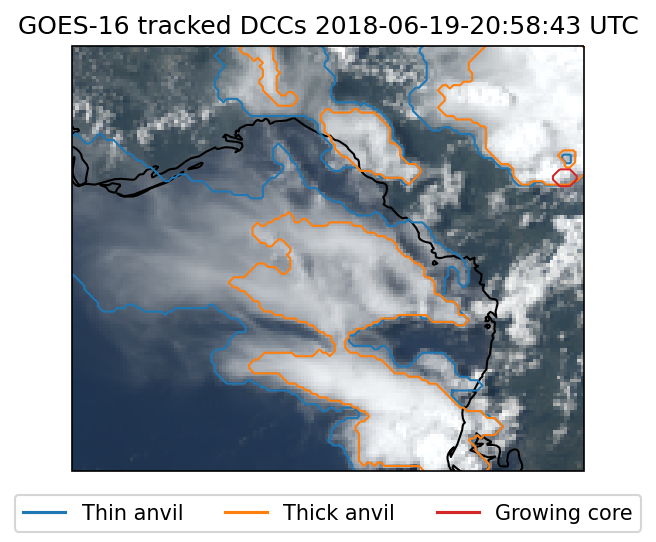

In [30]:
from tobac_flow.abi import get_abi_rgb
from tobac_flow.plotting import goes_figure
from dateutil.parser import parse as parse_date
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

# Animate brightness temperature and masks
fig = goes_figure(goes_ds, dpi=150)
ax = fig.subplot(111)
ax.coastlines()
img = ax.imshow(get_abi_rgb(goes_ds.isel(t=0), night_IR=True)) 
cntr = [ax.contour(outer_watershed[0], [0.5], colors=['C00'], linewidths=[1]),
        ax.contour(inner_watershed[0], [0.5], colors=['C01'], linewidths=[1]),
        ax.contour(growth_markers[0], [0.5], colors=['C03'], linewidths=[1])]

ax.set_title("GOES-16 tracked DCCs "+parse_date(goes_ds.t.astype('datetime64[s]').data[0].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")

plt.subplots_adjust(bottom=0.05, left=0.05, right=0.95)

import matplotlib.lines as mlines
fig.legend([mlines.Line2D([], [], color='C00'),
            mlines.Line2D([], [], color='C01'), 
            mlines.Line2D([], [], color='C03')], 
           ['Thin anvil', 'Thick anvil', 'Growing core'], 
           loc='lower center', ncol=3)

def init():
    return img, cntr

def animate(i):
    img.set_data(get_abi_rgb(goes_ds.isel(t=i), night_IR=True))
    for c in cntr:
        for coll in c.collections:
            try:
                coll.remove()
            except:
                pass
    cntr[0] = ax.contour(outer_watershed[i], [0.5], colors=['C00'], linewidths=[1])
    cntr[1] = ax.contour(inner_watershed[i], [0.5], colors=['C01'], linewidths=[1])
    cntr[2] = ax.contour(growth_markers[i], [0.5], colors=['C03'], linewidths=[1])
    ax.set_title("GOES-16 tracked DCCs "+parse_date(goes_ds.t.astype('datetime64[s]').data[i].astype(str)).strftime('%Y-%m-%d-%H:%M:%S')+" UTC")
    
    return img, cntr

anim = animation.FuncAnimation(fig, animate, init_func=init, frames=goes_ds.t.size, 
                               interval=40, blit=False)

from IPython.display import HTML, Image, display
HTML(anim.to_jshtml())

In [31]:
# Embed as a video
HTML(anim.to_html5_video())